In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'svg'

In [2]:
import os
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

import cv2
import torch
import numpy 
import numpy as np
import torchvision
from torchvision import transforms                                                                                                                                        
from PIL import Image
import pandas as pd

import sys
sys.path.append("../../src/")
sys.path.append("../")
import model
from datasets import imagenet
import config
from aux.utils import obtain_features_map, load_imgs, zscore, extract_valid
from aux.visualization import visualize_features_map
from utils.visualizations.visualize import concat_imgs, preprocess_arrays
from utils.function import recreate_image

# LRP module

## LRP

In [3]:
cd ../

/home/lincolnzjx/Desktop/Interpretation/jupyter


In [4]:
cd ../

/home/lincolnzjx/Desktop/Interpretation


In [5]:
cd extra/

/home/lincolnzjx/Desktop/Interpretation/extra


In [6]:
cd tutorial/

/home/lincolnzjx/Desktop/Interpretation/extra/tutorial


In [7]:
import utilss

In [8]:
def lrp(X, layers, L, selected_filters):
    """LRP
    Args:
        X: (3, 224, 224)
    """
    A = [X]+[None]*L
    for l in range(L): A[l+1] = layers[l].forward(A[l])
        
    scores = numpy.array(A[-1].data.view(-1))
    ind = numpy.argsort(-scores)
    
    _, output_channel, height, width = A[-1].shape
    input_channel, _, _, _ = A[-2].shape
    T = torch.zeros((input_channel, output_channel, height, width))
    T[:,selected_filter, :,:] = 1
    
    R = [None]*L + [(A[-1]*T).data]
    
    for l in range(1,L)[::-1]:
        
        A[l] = (A[l].data).requires_grad_(True)
    
        if isinstance(layers[l],torch.nn.MaxPool2d): 
            layers[l] = torch.nn.AvgPool2d(2)
    
        if isinstance(layers[l],torch.nn.Conv2d) or isinstance(layers[l],torch.nn.AvgPool2d):
            if l <= 16:       
                rho = lambda p: p + 0.25*p.clamp(min=0); 
                incr = lambda z: z+1e-9
            if 17 <= l <= 30: 
                rho = lambda p: p;                       
                incr = lambda z: z+1e-9+0.25*((z**2).mean()**.5).data
            if l >= 31:       
                rho = lambda p: p;                       
                incr = lambda z: z+1e-9
    
            z = incr(utilss.newlayer(layers[l],rho).forward(A[l]))  # step 1
            s = (R[l+1]/z).data                                    # step 2
            (z*s).sum().backward(); c = A[l].grad                  # step 3
            R[l] = (A[l]*c).data                                   # step 4
            
        else:
            R[l] = R[l+1]
    
#     for i,l in enumerate([1]):
#         utilss.heatmap(numpy.array(R[l][0]).sum(axis=0),0.5*i+1.5,0.5*i+1.5)
    
    A[0] = (A[0].data).requires_grad_(True)
    
    lb = (A[0].data*0+(0-mean)/std).requires_grad_(True)
    hb = (A[0].data*0+(1-mean)/std).requires_grad_(True)
    
    layers[0].bias = torch.nn.Parameter(torch.zeros_like(layers[0].bias))
    z = layers[0].forward(A[0])                                     # step 1 (a)
    z -= utilss.newlayer(layers[0],lambda p: p.clamp(min=0)).forward(lb)    # step 1 (b)
    z -= utilss.newlayer(layers[0],lambda p: p.clamp(max=0)).forward(hb)    # step 1 (c)
    z += 1e-9
    # 我的改
    #z = torch.clamp(z, min=1e-9)
    #s = torch.sign(z) * ( R[1] / (torch.abs(z) + 1e-9) )
    s = (R[1]/z).data                                                      # step 2
    
#     print(np.isnan(s.detach().numpy()).mean())
    (z*s).sum().backward(); c,cp,cm = A[0].grad,lb.grad,hb.grad            # step 3
#     print(np.isnan(lb.detach().numpy()).mean())
#     print(np.isnan(hb.detach().numpy()).mean())
#     print(np.isnan(cm.detach().numpy()).mean())
    R[0] = (A[0]*c+lb*cp+hb*cm).data                                       # step 4
    

    return R

In [9]:
#layers[0].bias = torch.nn.Parameter(torch.zeros_like(layers[0].bias))
#print(layers[0].bias)

## Main

In [10]:
# Image
mean = torch.Tensor([0.485, 0.456, 0.406]).reshape(1,-1,1,1)
std  = torch.Tensor([0.229, 0.224, 0.225]).reshape(1,-1,1,1)

# Model
model = torchvision.models.vgg16(pretrained=True) 
model.eval()
layers = list(model._modules['features']) + utilss.toconv(list(model._modules['classifier']))
for index, layer in enumerate(layers):
    print(index, layer)

0 Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1 ReLU(inplace=True)
2 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3 ReLU(inplace=True)
4 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
5 Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
6 ReLU(inplace=True)
7 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
8 ReLU(inplace=True)
9 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
10 Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
11 ReLU(inplace=True)
12 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
13 ReLU(inplace=True)
14 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
15 ReLU(inplace=True)
16 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
17 Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
18 ReLU(inplace=True)
19 Conv2d(512, 512, kernel_size=(3, 3)

In [11]:
def main(exp, cnn_layer, filter_pos, class_index):
    # Load data 
    reverse_mean = [-0.485, -0.456, -0.406]
    reverse_std = [1/0.229, 1/0.224, 1/0.225]
    num_class = 30
    train_transform = transforms.Compose([                                                                                                                                
        transforms.Resize((224, 224), interpolation=Image.BILINEAR),                                                                                              
        transforms.ToTensor(),                                                                                                                                            
           ])         
    trainset = imagenet.ImageNet(root="/media/lincolnzjx/HardDisk/Datasets/", 
                                 is_train=True, transform=train_transform)
    trainset.set_data([class_index], num_class)
    imgs_path = []                                                                                                                                                            
    images = []
    labels = []
    for img, label, img_path in trainset:                                                                                                                                     
        images.append(img.unsqueeze(0))                                                                                                                                       
        labels.append(label)                                                                                                                                                  
        imgs_path.append(img_path)  
        
    path = "/home/lincolnzjx/Desktop/Interpretation/saved/generated/"  
    path = os.path.join(path, "LRP", exp)
    os.makedirs(path, exist_ok=True)
    index = 0
    for img, img_path in zip(images, imgs_path):
        img_name = img_path.split("/")[-1].split(".")[0]
        color_file_path = os.path.join(path, "color_" + img_name+".png")
        real_file_path = os.path.join(path, img_name+".png")
        index = index+1
        img = img[0].permute((1,2,0)).numpy()
#         Image.fromarray(((img * 255).astype(np.uint8)))
        X = (torch.FloatTensor(img[numpy.newaxis].transpose([0,3,1,2])*1) - mean) / std
        R = lrp(X, layers, cnn_layer, filter_pos)
        utilss.heatmap(numpy.array(R[0][0]).sum(axis=0),3.5,3.5, path=color_file_path)
        
        new_img = recreate_image(R[0][0], reverse_mean, reverse_std)
        Image.fromarray(new_img).save(real_file_path)

# RUN

## Class 950

In [12]:
# excel_path = "Single.xlsx"
excel_path = "../../jupyter/analysis/week9/Batches.xlsx"
sheet = "950"
# sheet = "950"
excepts = ["052148"]

=> RUN  061300 1 16 950
Len of new dataset is :30


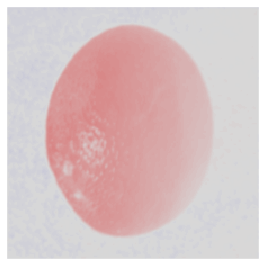

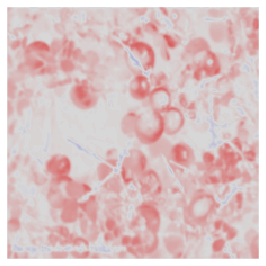

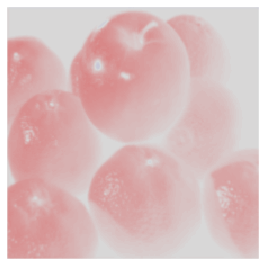

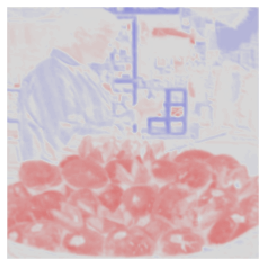

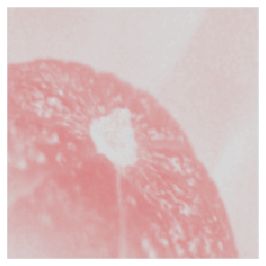

...

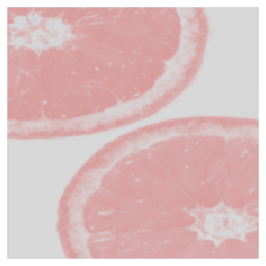

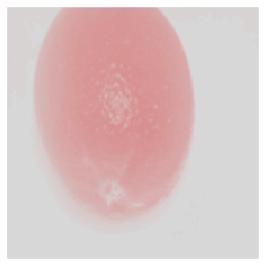

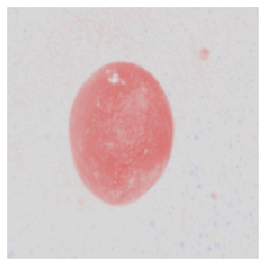

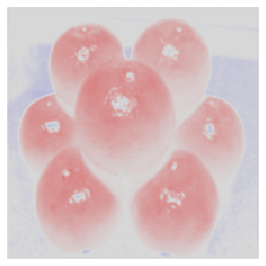

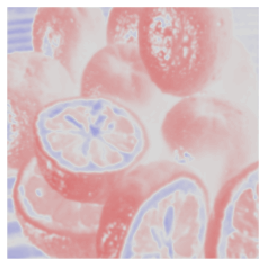

=> RUN  052490 1 16 950
Len of new dataset is :30


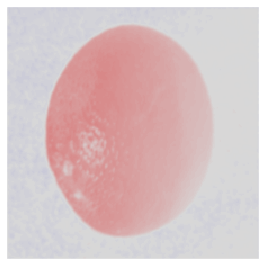

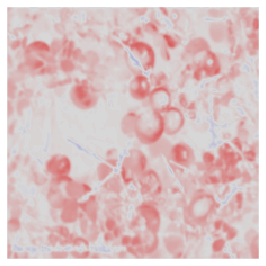

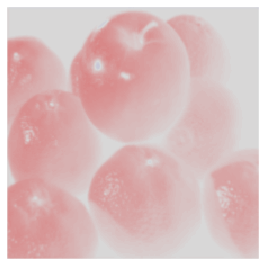

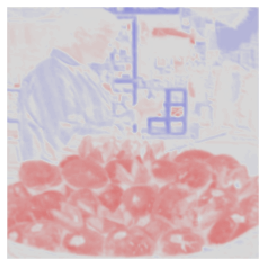

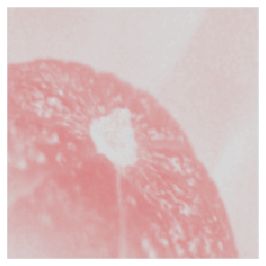

...

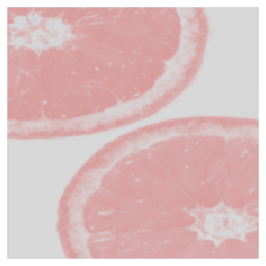

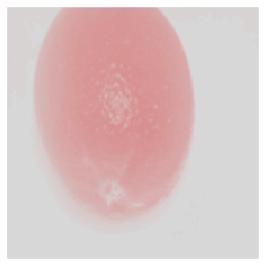

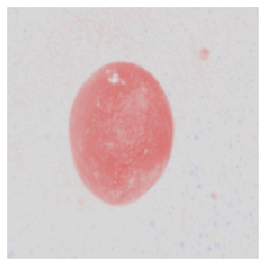

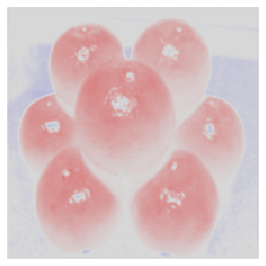

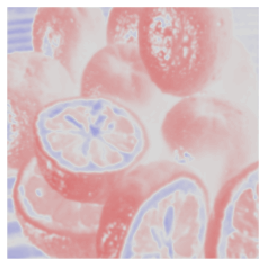

=> RUN  7001 1 47 950
Len of new dataset is :30


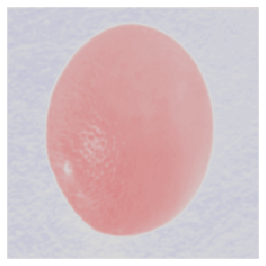

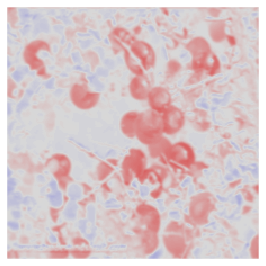

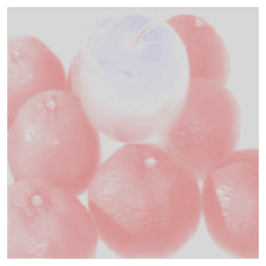

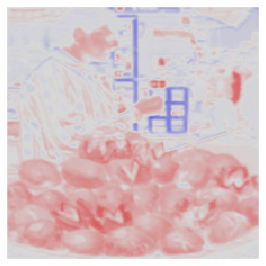

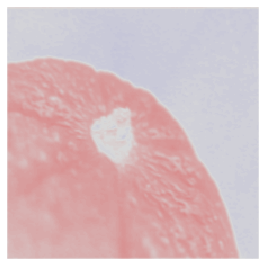

...

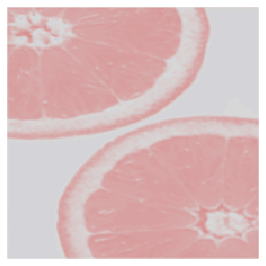

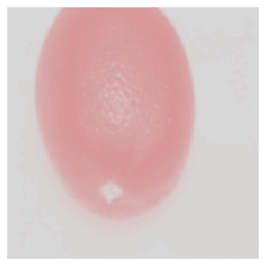

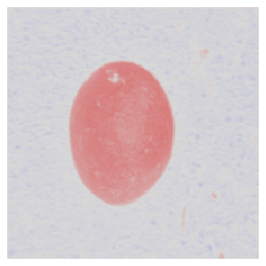

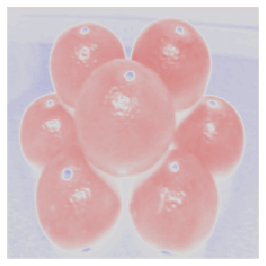

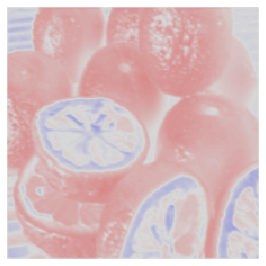

=> RUN  7004 3 28 950
Len of new dataset is :30


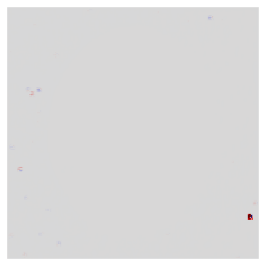

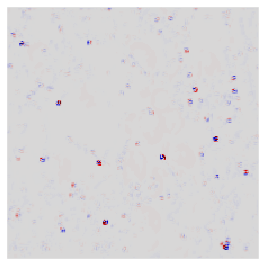

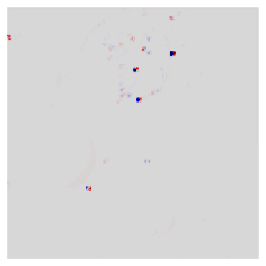

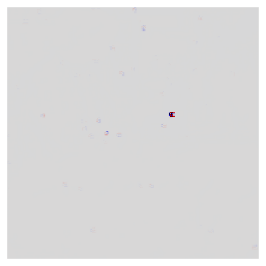

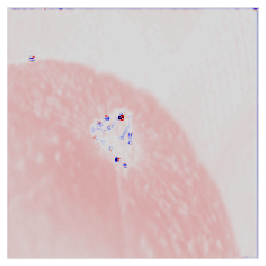

...

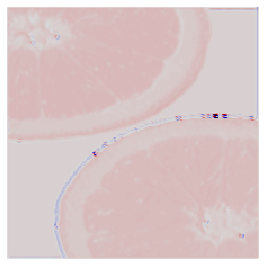

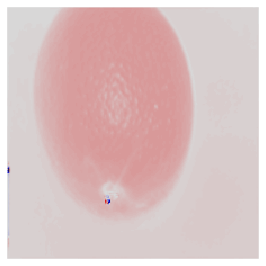

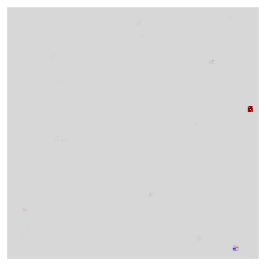

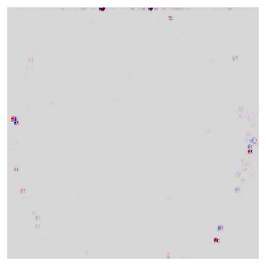

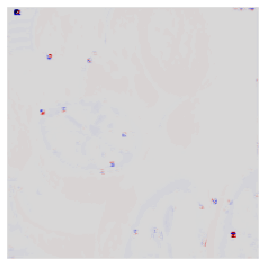

=> RUN  060490 3 20 950
Len of new dataset is :30


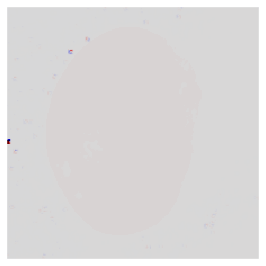

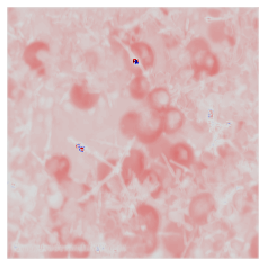

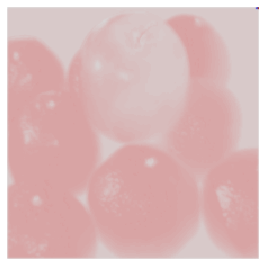

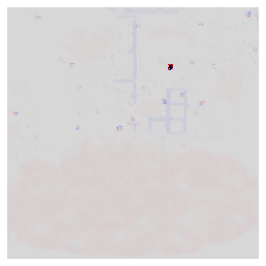

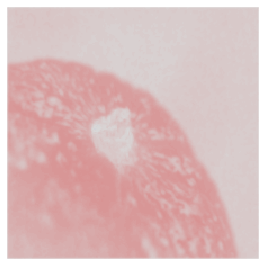

...

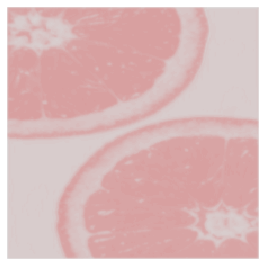

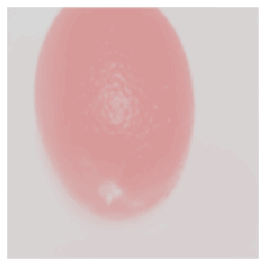

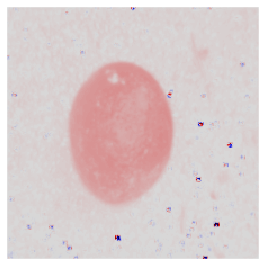

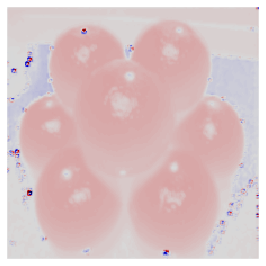

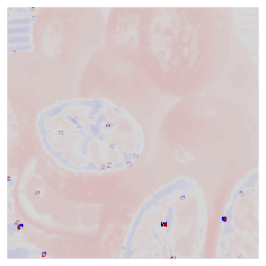

=> RUN  7005 6 19 950
Len of new dataset is :30


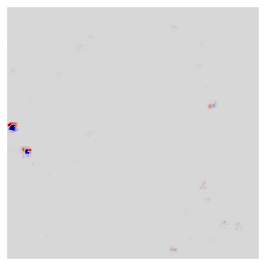

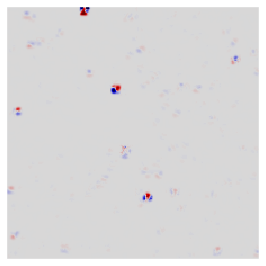

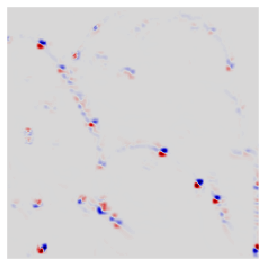

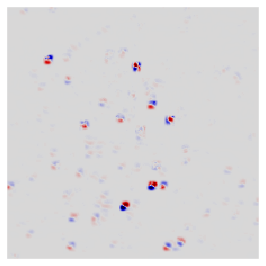

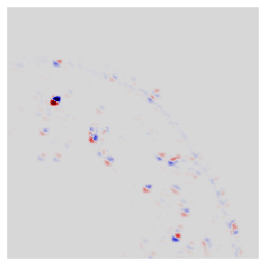

...

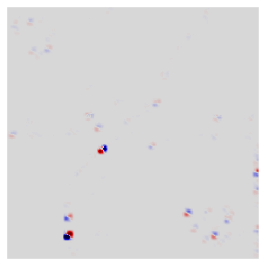

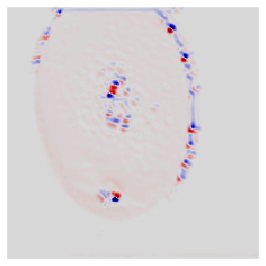

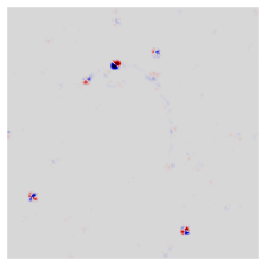

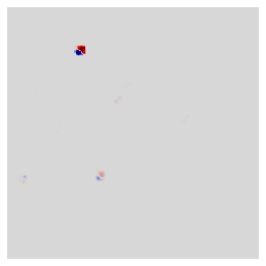

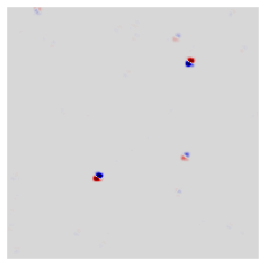

=> RUN  7006 8 99 950
Len of new dataset is :30


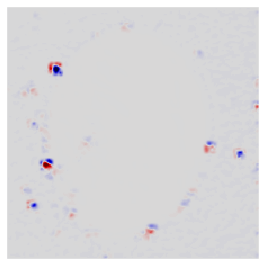

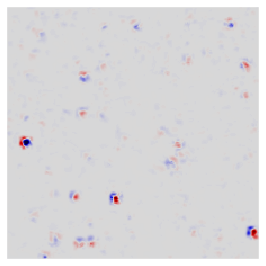

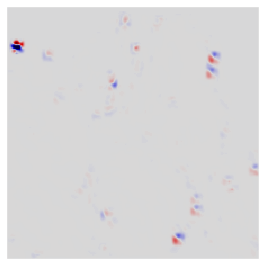

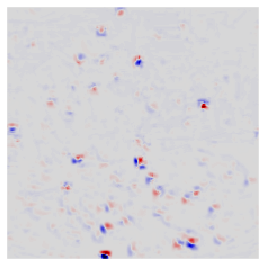

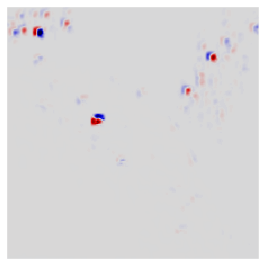

...

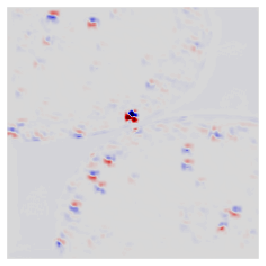

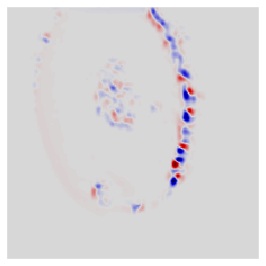

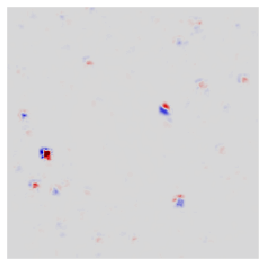

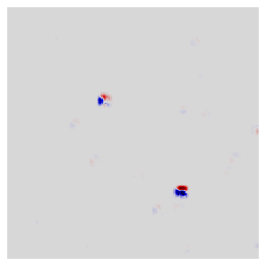

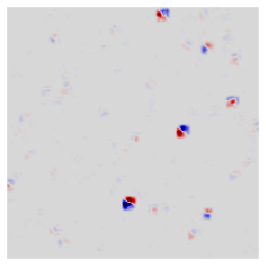

=> RUN  70071 11 75 950
Len of new dataset is :30


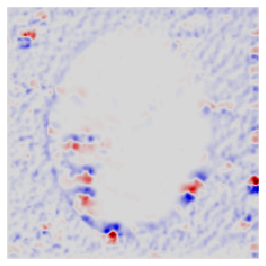

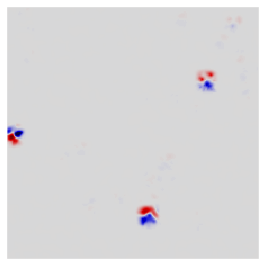

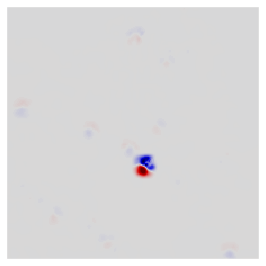

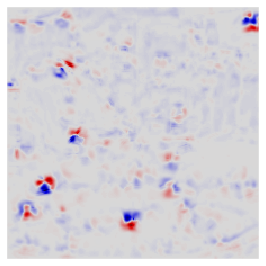

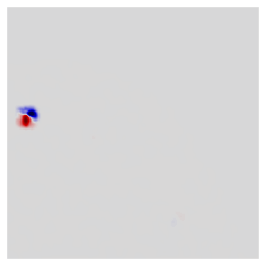

...

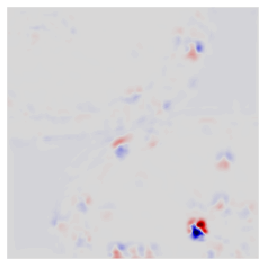

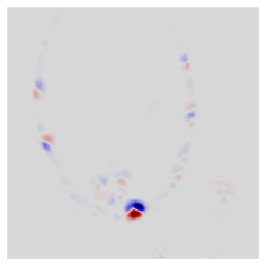

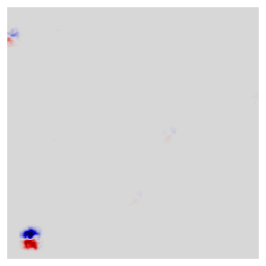

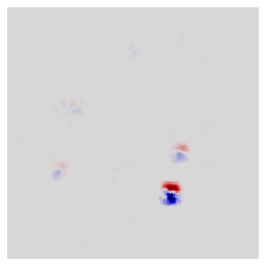

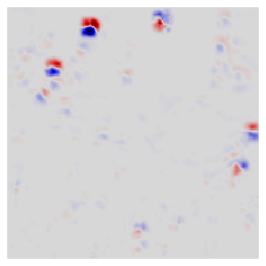

=> RUN  70081 13 91 950
Len of new dataset is :30


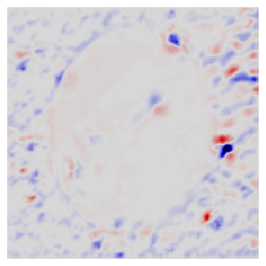

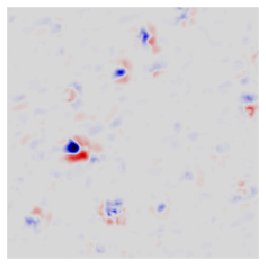

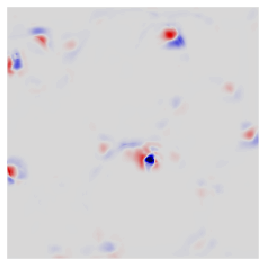

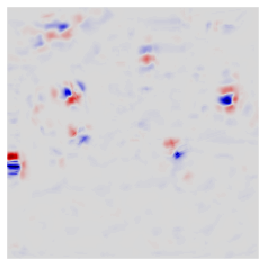

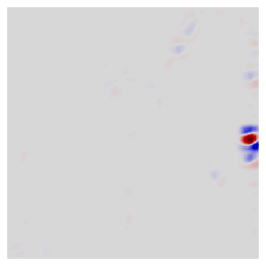

...

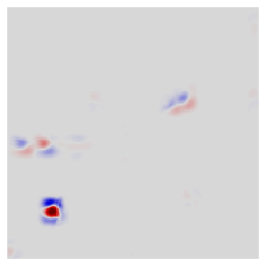

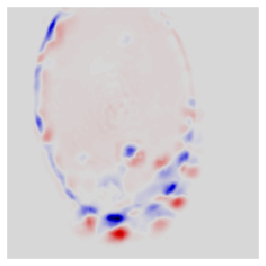

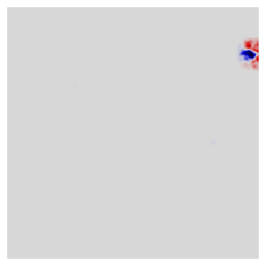

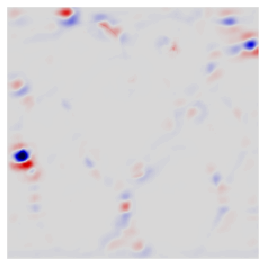

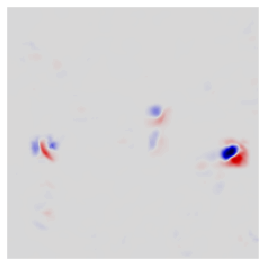

=> RUN  7009 15 173 950
Len of new dataset is :30


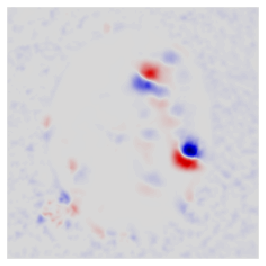

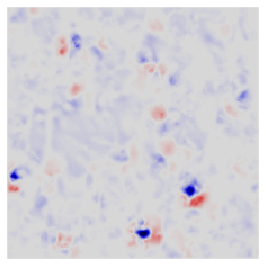

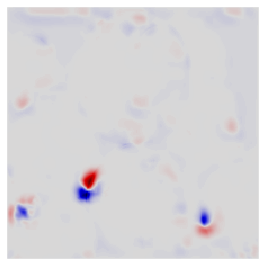

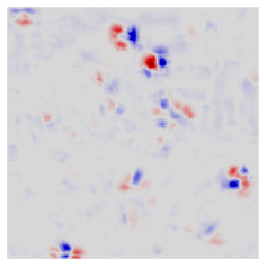

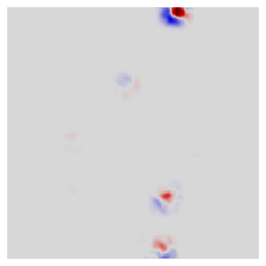

...

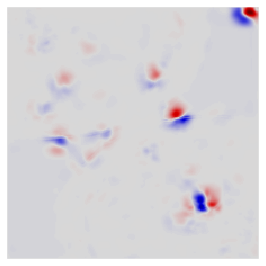

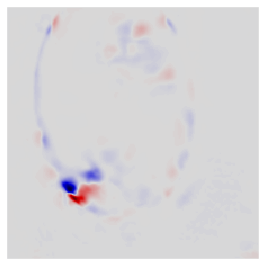

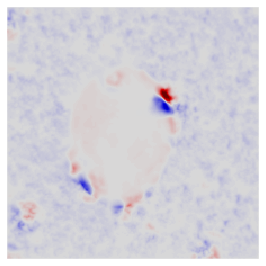

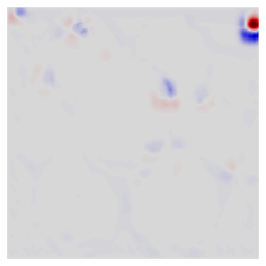

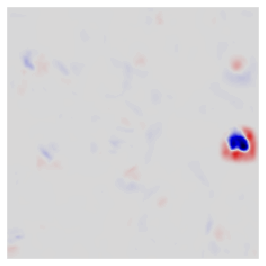

=> RUN  7010 18 49 950
Len of new dataset is :30


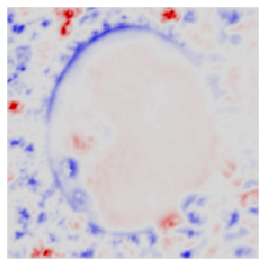

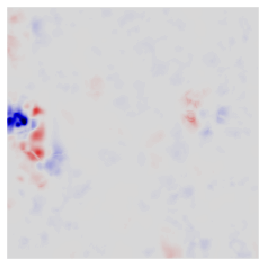

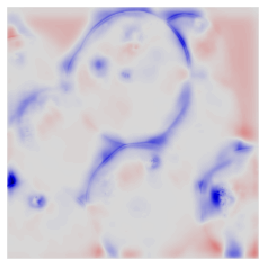

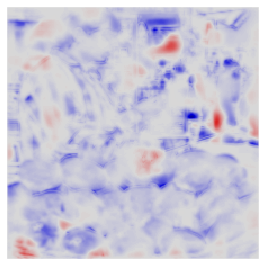

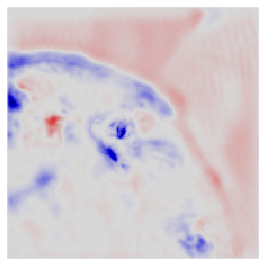

...

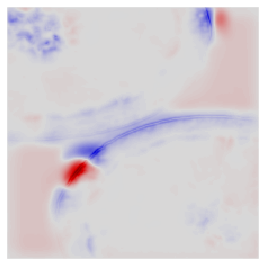

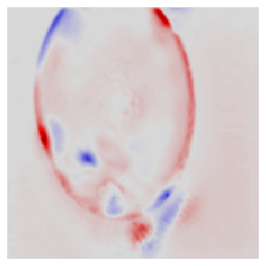

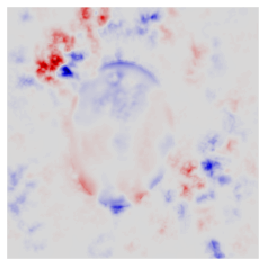

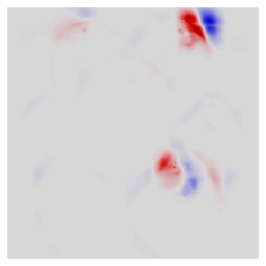

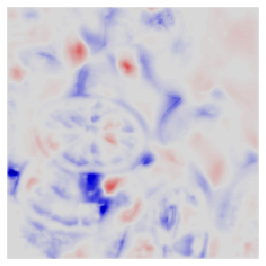

=> RUN  060493 18 101 950
Len of new dataset is :30


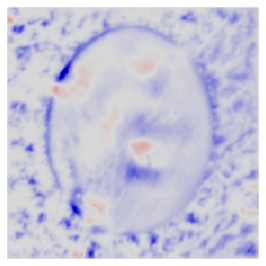

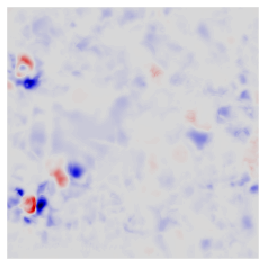

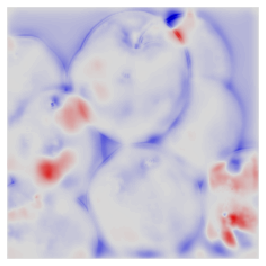

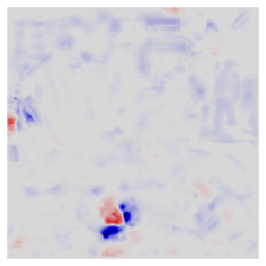

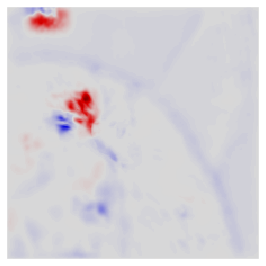

...

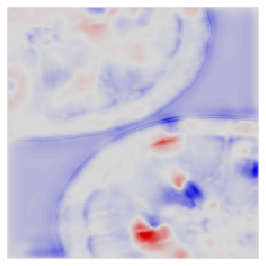

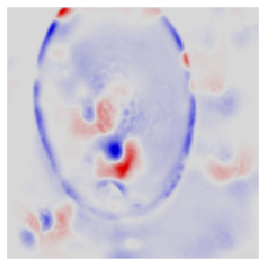

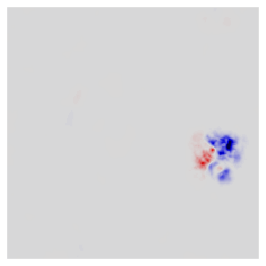

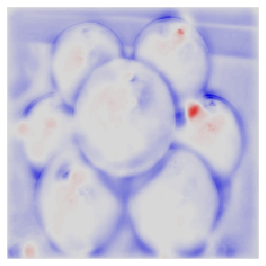

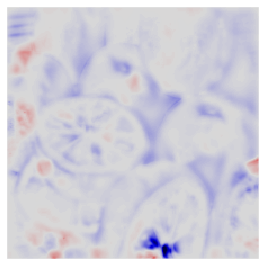

=> RUN  7011 20 398 950
Len of new dataset is :30


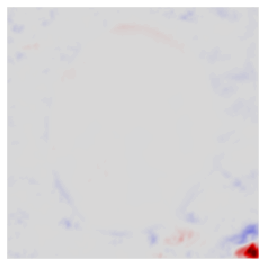

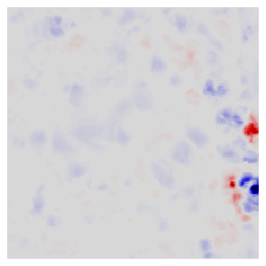

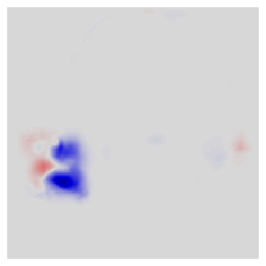

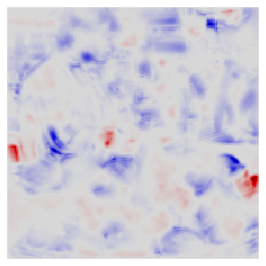

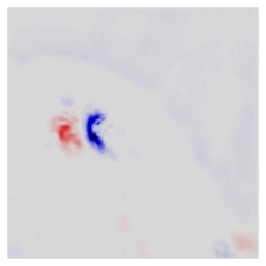

...

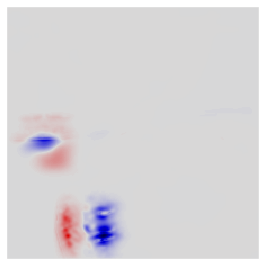

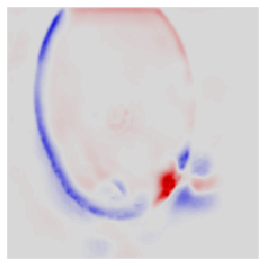

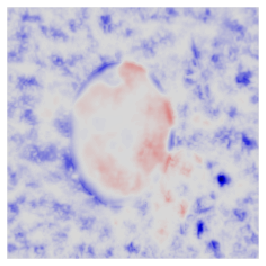

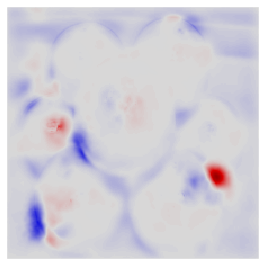

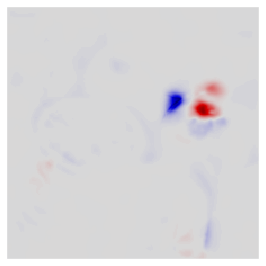

=> RUN  7012 22 485 950
Len of new dataset is :30


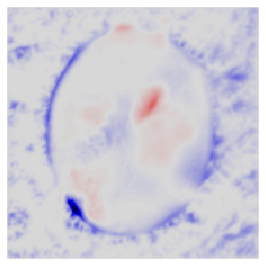

/home/lincolnzjx/anaconda3/envs/Py36/lib/python3.6/site-packages/matplotlib/colors.py:581: RuntimeWarning:

invalid value encountered in less



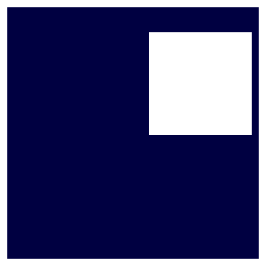

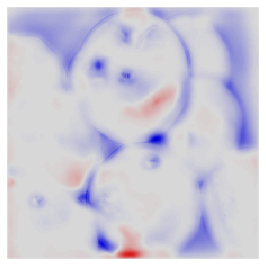

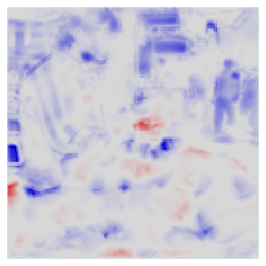

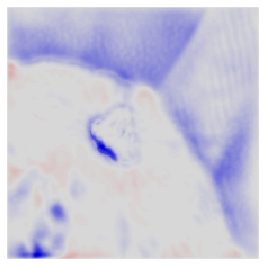

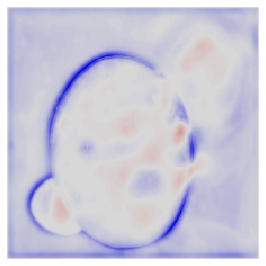

...

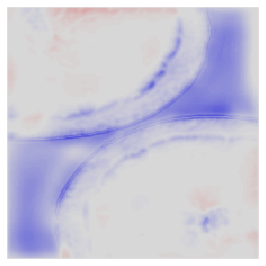

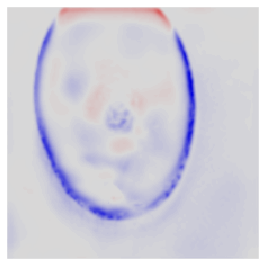

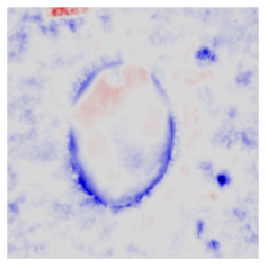

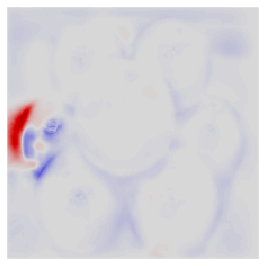

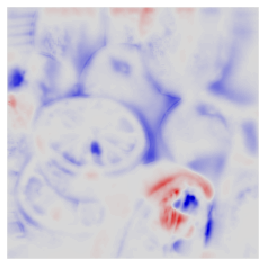

=> RUN  7013 25 1 950
Len of new dataset is :30


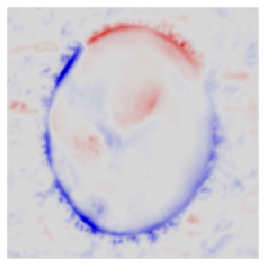

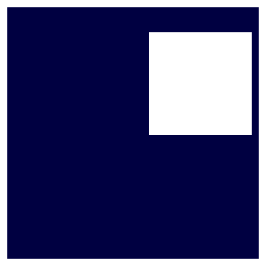

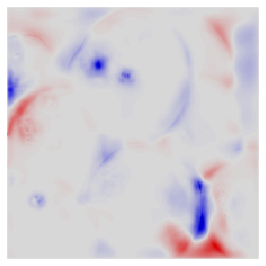

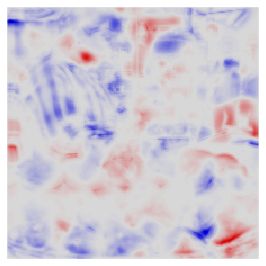

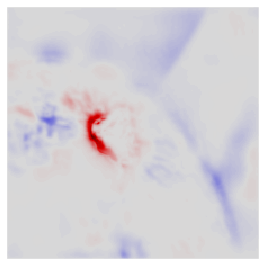

...

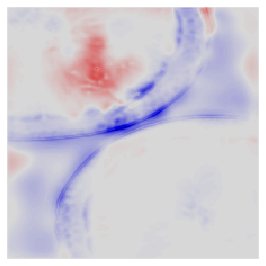

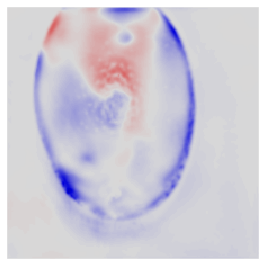

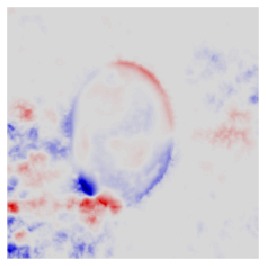

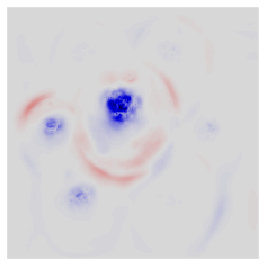

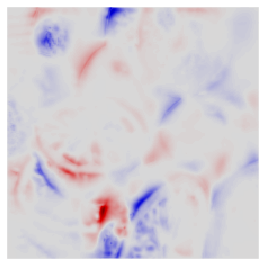

=> RUN  060495 27 161 950
Len of new dataset is :30


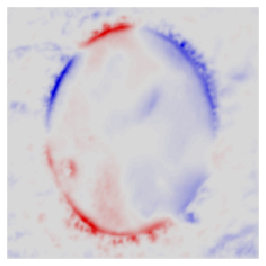

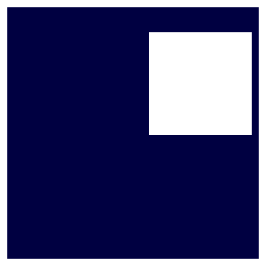

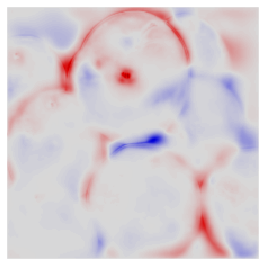

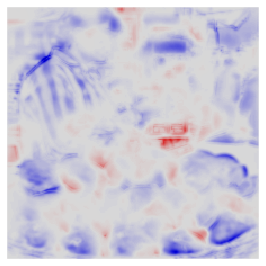

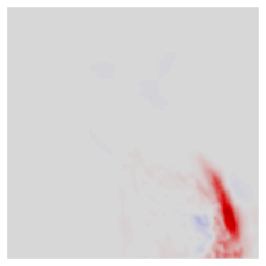

...

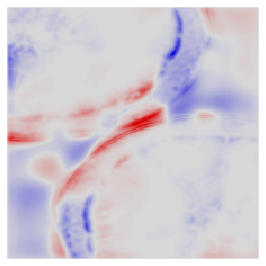

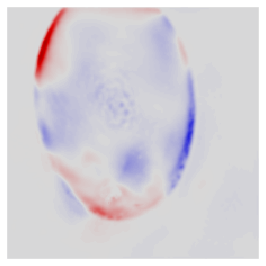

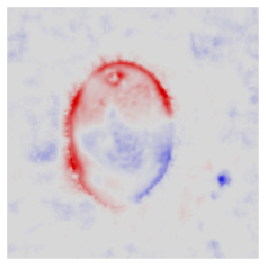

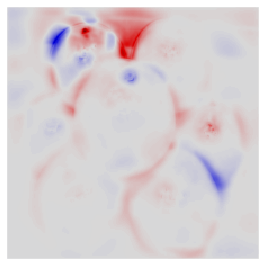

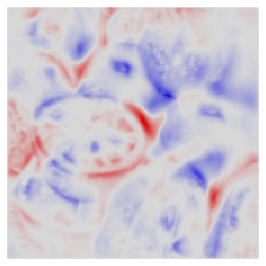

=> RUN  060496 29 334 950
Len of new dataset is :30


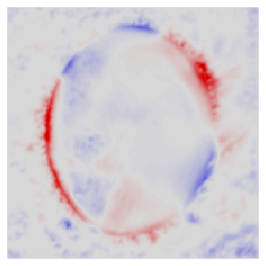

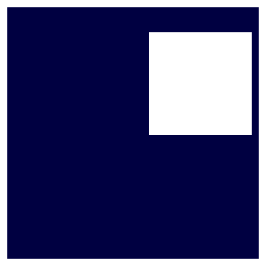

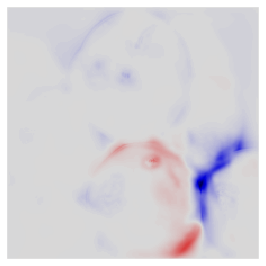

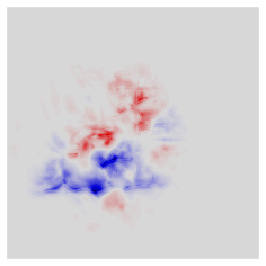

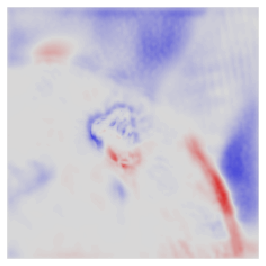

...

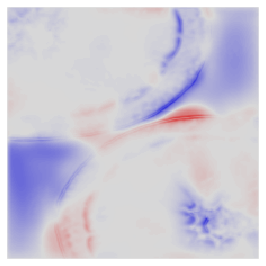

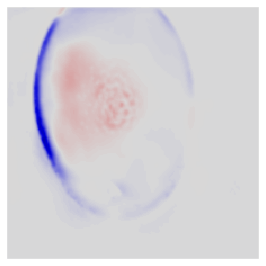

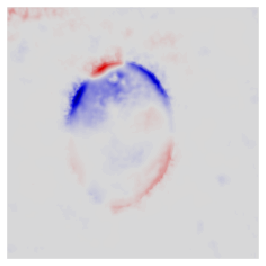

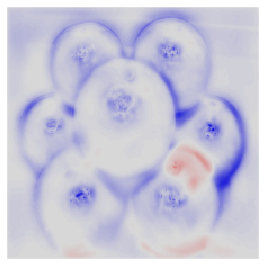

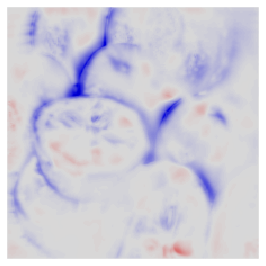

=> RUN  071600 1 16 950
Len of new dataset is :30


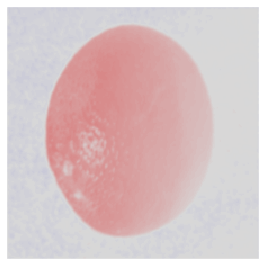

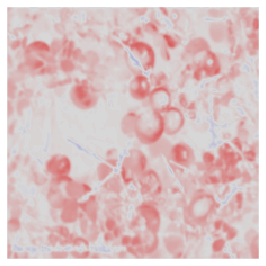

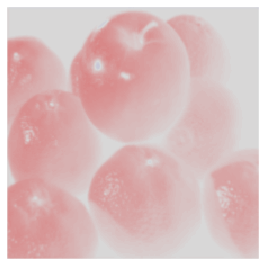

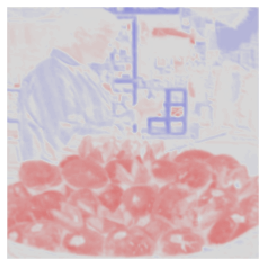

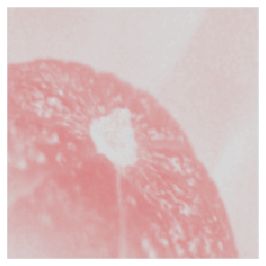

...

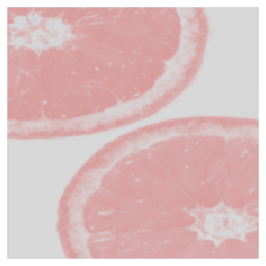

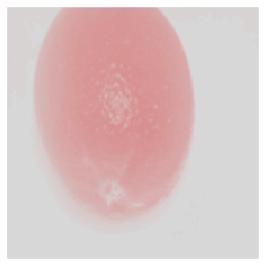

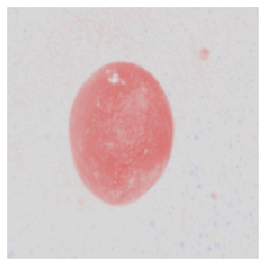

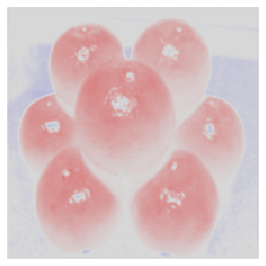

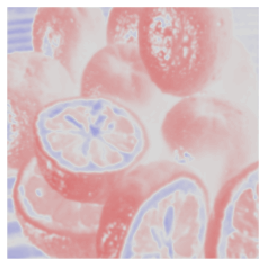

=> RUN  071601 3 20 950
Len of new dataset is :30


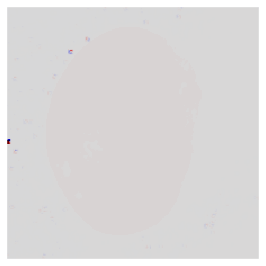

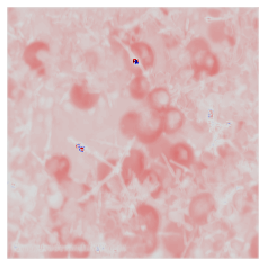

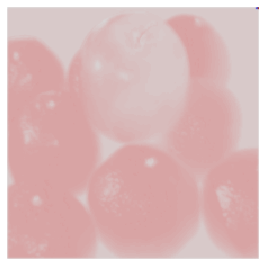

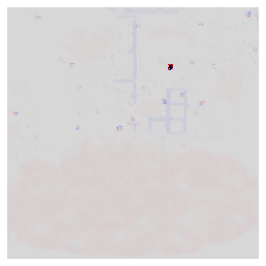

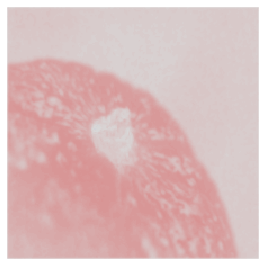

...

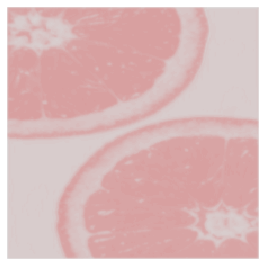

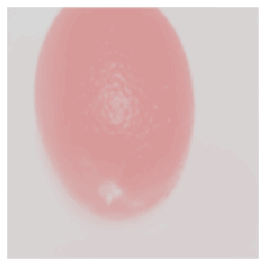

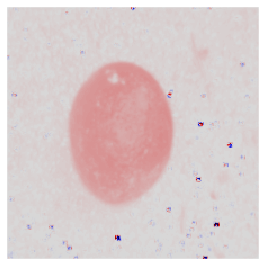

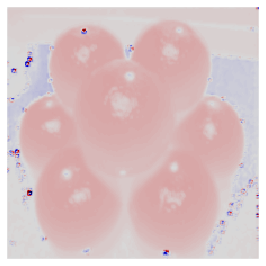

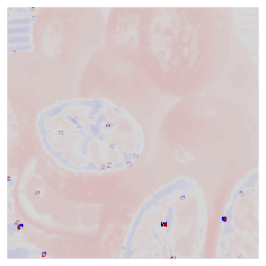

In [13]:
xlsx = pd.ExcelFile(excel_path)
excel = pd.read_excel(xlsx, sheet, Sdtype={"exp": str, 
                                           "selected_layer": int,
                                           "selected_filter": int, 
                                           "class_index": int,
                                            "Done": str}).values
for data in excel:
    exp, selected_layer, selected_filter, class_index, done = data[0], data[1], \
        data[2], data[3], data[4]
    exp = exp.replace("x", "")
    if exp in excepts:
        print("=> Skip")
    else:
        if done == "N":
            print("=> RUN ", exp, selected_layer, selected_filter, class_index)
            main(exp, selected_layer, selected_filter, class_index)

## Class 14

# excel_path = "Single.xlsx"
excel_path = "../../jupyter/analysis/week9/Batches.xlsx"
sheet = "Others"
# sheet = "950"
excepts = ["052148"]
c_index = 14

xlsx = pd.ExcelFile(excel_path)
excel = pd.read_excel(xlsx, sheet, Sdtype={"exp": str, 
                                           "selected_layer": int,
                                           "selected_filter": int, 
                                           "class_index": int,
                                            "Done": str}).values
for data in excel:
    exp, selected_layer, selected_filter, class_index, done = data[0], data[1], \
        data[2], data[3], data[4]
    exp = exp.replace("x", "")
    if exp in excepts:
        print("=> Skip")
    else:
        if done == "N" and class_index == c_index:
            print("=> RUN ", exp, selected_layer, selected_filter, class_index)
            main(exp, selected_layer, selected_filter, class_index)